In [1]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import json
from IPython.display import display, Markdown

import sys
sys.path.append('../')

import utils
from evalutils.roc import get_bootstrapped_roc_ci_curves
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

## directory where results are
EXPERIMENT_DIR = f"/data/bodyct/experiments/lung-malignancy-fairness-shaurya"
NLST_PREDS = f"{EXPERIMENT_DIR}/nlst"

TEAMS_DIR = "C:/Users/shaur/OneDrive - Radboudumc/Documents - Master - Shaurya Gaur/General/Malignancy-Estimation Results/nlst"
NLST_PREDS = TEAMS_DIR ## Comment out if not using Teams backup (aka Chansey is up :)

In [2]:
nlst_preds_nodule = pd.read_csv(f"{NLST_PREDS}/nlst_demov2_allmodels.csv")
nlst_preds_nodule.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16077 entries, 0 to 16076
Columns: 102 entries, PatientID to Married
dtypes: bool(10), float64(77), int64(11), object(4)
memory usage: 11.4+ MB


In [3]:
with open(f'{NLST_PREDS}/nlst_demo_v2_cols.json') as json_data:
    nlst_democols = json.load(json_data)
    json_data.close()

In [51]:
nlst_preds = utils.prep_nlst_preds(nlst_preds_nodule, scanlevel=True, tijmen=False, sybil=True)
nlst_preds.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5911 entries, 0 to 10150
Data columns (total 96 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   PatientID              5911 non-null   int64  
 1   StudyDate              5911 non-null   int64  
 2   SeriesInstanceUID      5911 non-null   object 
 3   LesionID               5911 non-null   int64  
 4   Spiculation            5911 non-null   bool   
 5   Diameter [mm]          5911 non-null   float64
 6   Age                    5911 non-null   int64  
 7   Gender                 5911 non-null   int64  
 8   FamilyHistoryLungCa    5911 non-null   bool   
 9   Emphysema              5911 non-null   bool   
 10  NoduleInUpperLung      5911 non-null   bool   
 11  NoduleCounts           5911 non-null   int64  
 12  SCT_EPI_LOC            5636 non-null   float64
 13  xie_gc_gclobe150       275 non-null    float64
 14  loclup                 581 non-null    float64
 15  locrup  

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:344: FutureWarning: The provided callable <built-in function max> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "max" instead.
  df[c] = dfgb[c].transform(max)
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:344: FutureWarning: The provided callable <built-in function max> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "max" instead.
  df[c] = dfgb[c].transform(max)


In [52]:
MODEL_TO_COL = {
    "Venkadesh": "DL",
    # "de Haas Combined": "Thijmen_mean",
    "de Haas Local": "Thijmen_local",
    "de Haas Global (hidden nodule)": "Thijmen_global_hidden",
    # "de Haas Global (shown nodule)": "Thijmen_global_show",
    "Sybil": "sybil_year1",
    "PanCan2b": "PanCan2b",
}

Sanity check - let's see internal NLST validation results.

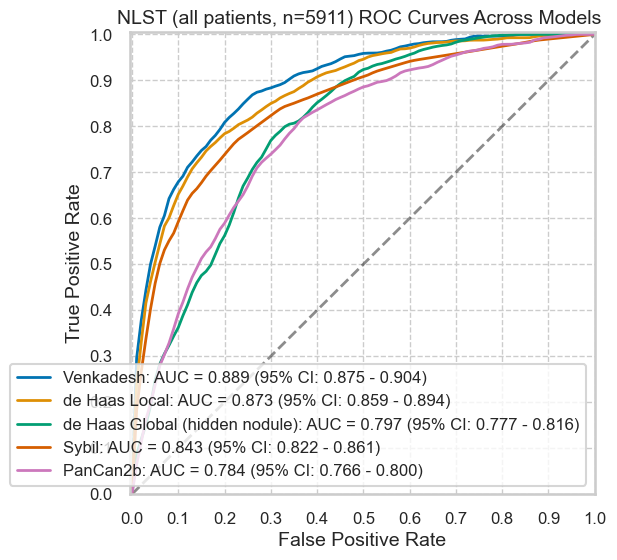

In [53]:
utils.rocs_models(nlst_preds, models=MODEL_TO_COL, dataset_label="NLST")

In [54]:
def plot_by_category(df, cat):
    display(Markdown(f"#### {cat}"))
    catinfo, perfs, sigtestresults = utils.roc_cm_by_category(df, cat, MODEL_TO_COL)
    display(catinfo)
    
    if sigtestresults is not None:
        print("Hanley-McNeil significance test results:")
        display(sigtestresults)
    else:
        print("More than binary: not computing significance test results.")

    # for m in perfs:
    #     print(m)
    #     display(perfs[m])

## Split Data by a Category

#### Emphysema

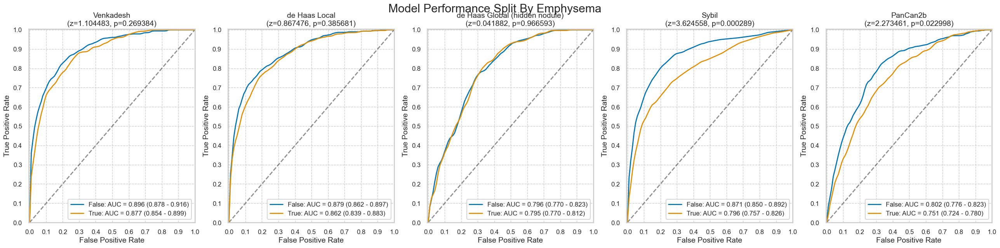

,num,pct,num_mal,pct_mal
False,3755,63.52563,317,8.442077
True,2156,36.47437,264,12.244898


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,1.104483,0.867476,0.041882,3.624558,2.273461
p,0.269384,0.385681,0.966593,0.000289,0.022998


In [67]:
SPLIT_CAT = 'Emphysema'
split_groups = nlst_preds.groupby(SPLIT_CAT)
plot_by_category(nlst_preds, SPLIT_CAT)

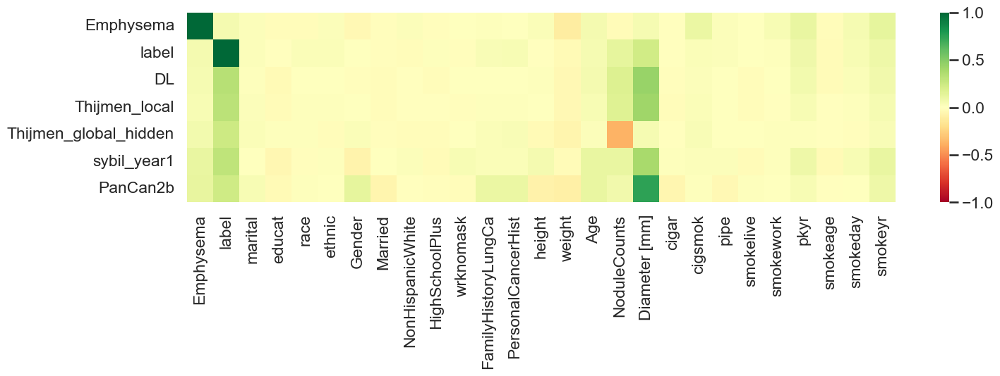

In [68]:
cols_list = list(set([SPLIT_CAT, 'label'] + list(MODEL_TO_COL.values()) + nlst_democols['cat']['demo'] + nlst_democols['cat']['other'] + nlst_democols['num']['demo'] + nlst_democols['num']['other'] + ['Diameter [mm]'] + nlst_democols['cat']['smoke'] + nlst_democols['num']['smoke'] ))
correlations = nlst_preds[cols_list].corr(method='kendall').round(4)

corr_rows = [SPLIT_CAT, 'label'] + list(MODEL_TO_COL.values())
corr_cols = [SPLIT_CAT, 'label'] + nlst_democols['cat']['demo'] + nlst_democols['cat']['other'] + nlst_democols['num']['demo'] + nlst_democols['num']['other'] + ['Diameter [mm]'] + nlst_democols['cat']['smoke'] + nlst_democols['num']['smoke'] 
plt.figure(figsize=(len(corr_cols) * 0.6, len(corr_rows) * 0.5))
sns.heatmap(correlations.loc[corr_rows, corr_cols], cmap='RdYlGn', vmin=-1, vmax=1)
plt.show()

## Plot intersectional results by category

In [69]:
def plot_intersectional(df, cat, split_cat=SPLIT_CAT, split_groups=split_groups):
    for splitval, splitdf in split_groups:
        display(Markdown(f"#### {cat}: {split_cat} = {splitval}"))
        catinfo, perfs, sigtestresults = utils.roc_cm_by_category(splitdf, cat, MODEL_TO_COL)
        display(catinfo)
        
        if sigtestresults is not None:
            print("Hanley-McNeil significance test results:")
            display(sigtestresults)
        else:
            print("More than binary: not computing significance test results.")

        # for m in perfs:
        #     print(m)
        #     display(perfs[m])

### Included columns (from predictions)

#### wrknomask: Emphysema = False

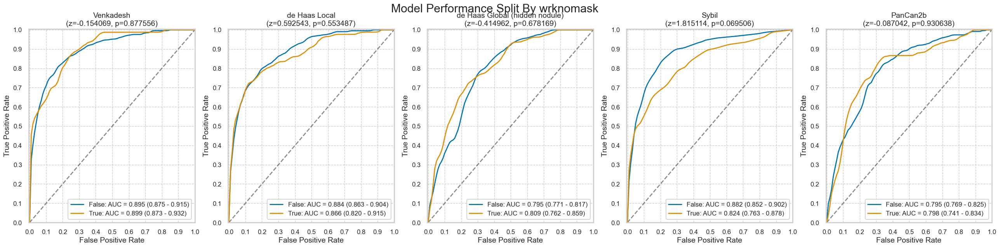

,num,pct,num_mal,pct_mal
False,2809,74.806924,239,8.508366
True,946,25.193076,78,8.245243


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.154069,0.592543,-0.414962,1.815114,-0.087042
p,0.877556,0.553487,0.678169,0.069506,0.930638


#### wrknomask: Emphysema = True

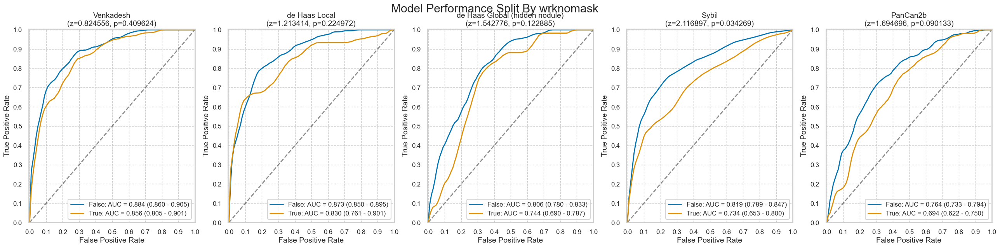

,num,pct,num_mal,pct_mal
False,1598,74.118738,203,12.703379
True,558,25.881262,61,10.931900


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.824556,1.213414,1.542776,2.116897,1.694696
p,0.409624,0.224972,0.122885,0.034269,0.090133


#### FamilyHistoryLungCa: Emphysema = False

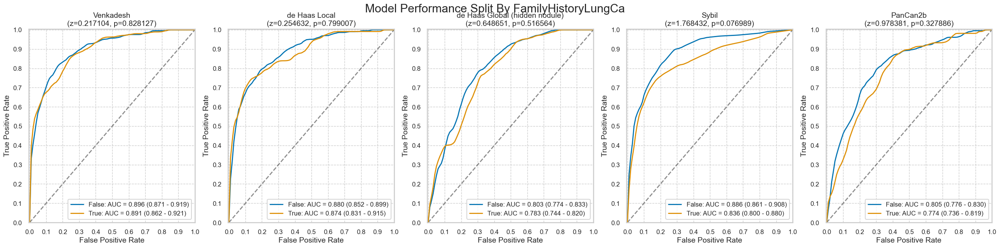

,num,pct,num_mal,pct_mal
False,2803,74.647137,212,7.563325
True,952,25.352863,105,11.029412


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.217104,0.254632,0.648651,1.768432,0.978381
p,0.828127,0.799007,0.516564,0.076989,0.327886


#### FamilyHistoryLungCa: Emphysema = True

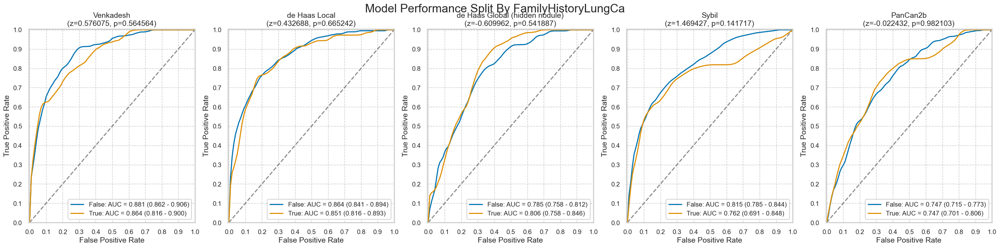

,num,pct,num_mal,pct_mal
False,1581,73.330241,189,11.954459
True,575,26.669759,75,13.043478


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.576075,0.432688,-0.609962,1.469427,-0.022432
p,0.564564,0.665242,0.541887,0.141717,0.982103


#### PersonalCancerHist: Emphysema = False

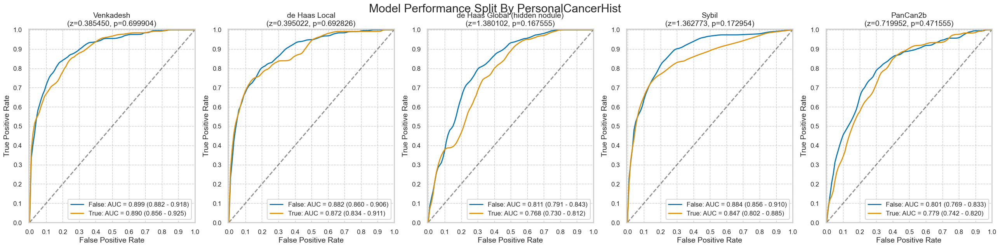

,num,pct,num_mal,pct_mal
False,2667,71.0253,194,7.274091
True,1088,28.9747,123,11.305147


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.385450,0.395022,1.380102,1.362773,0.719952
p,0.699904,0.692826,0.167555,0.172954,0.471555


#### PersonalCancerHist: Emphysema = True

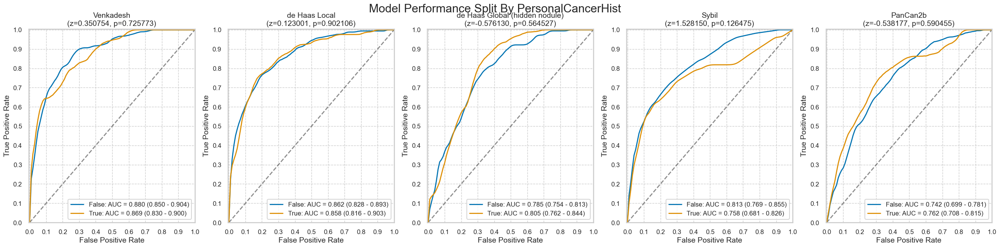

,num,pct,num_mal,pct_mal
False,1516,70.315399,183,12.07124
True,640,29.684601,81,12.65625


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.350754,0.123001,-0.576130,1.528150,-0.538177
p,0.725773,0.902106,0.564527,0.126475,0.590455


In [70]:
for c in nlst_democols['cat']['other']:
    plot_intersectional(nlst_preds, c)

### Demographics

#### marital: Emphysema = False

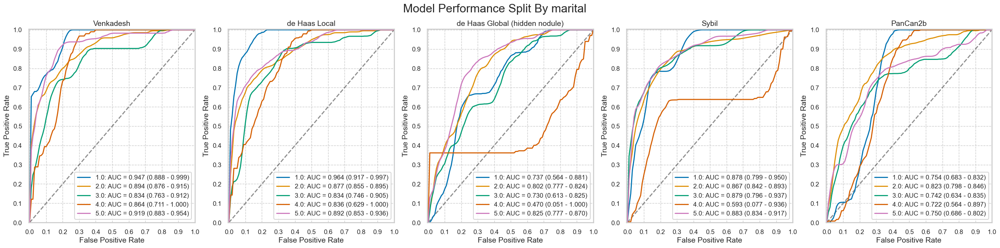

,num,pct,num_mal,pct_mal
1.0,153,4.083267,9,5.882353
2.0,2537,67.707499,208,8.198660
3.0,321,8.566853,29,9.034268
4.0,40,1.067521,3,7.500000
5.0,696,18.574860,67,9.626437


More than binary: not computing significance test results.


#### marital: Emphysema = True

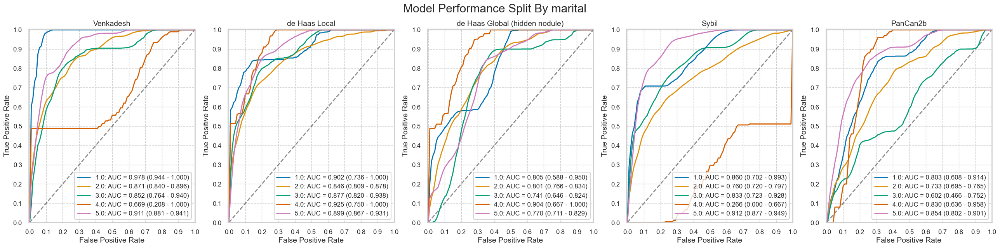

,num,pct,num_mal,pct_mal
1.0,76,3.533240,7,9.210526
2.0,1437,66.806137,176,12.247738
3.0,186,8.647141,20,10.752688
4.0,25,1.162250,2,8.000000
5.0,427,19.851232,58,13.583138


More than binary: not computing significance test results.


#### educat: Emphysema = False

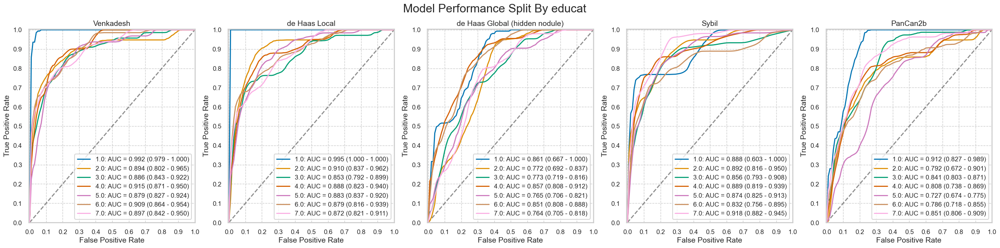

,num,pct,num_mal,pct_mal
1.0,66,1.791045,5,7.575758
2.0,188,5.101764,22,11.702128
3.0,912,24.748982,70,7.675439
4.0,549,14.898236,43,7.832423
5.0,821,22.279512,62,7.551766
6.0,585,15.875170,54,9.230769
7.0,564,15.305292,53,9.397163


More than binary: not computing significance test results.


#### educat: Emphysema = True

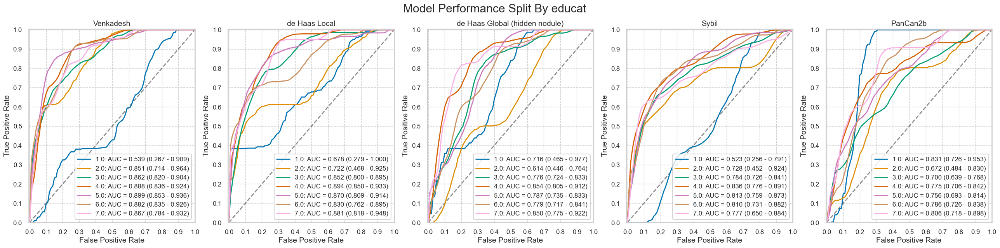

,num,pct,num_mal,pct_mal
1.0,45,2.127660,4,8.888889
2.0,102,4.822695,10,9.803922
3.0,567,26.808511,71,12.522046
4.0,303,14.326241,44,14.521452
5.0,480,22.695035,64,13.333333
6.0,328,15.508274,42,12.804878
7.0,290,13.711584,23,7.931034


More than binary: not computing significance test results.


#### race: Emphysema = False

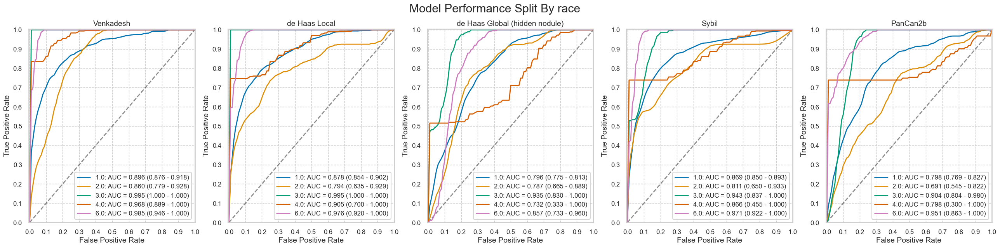

,num,pct,num_mal,pct_mal
1.0,3494,93.497458,287,8.214081
2.0,115,3.077335,15,13.043478
3.0,52,1.391491,2,3.846154
4.0,13,0.347873,5,38.461538
5.0,11,0.294354,1,9.090909
6.0,52,1.391491,5,9.615385


More than binary: not computing significance test results.


#### race: Emphysema = True

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:159: RuntimeWarning: invalid value encountered in scalar divide
  metrics["npv"] = tn / (tn + fn)  ## negative predictive value
c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:161: RuntimeWarning: invalid value encountered in scalar divide
  metrics["for"] = fn / (fn + tn)  ## False omission rate


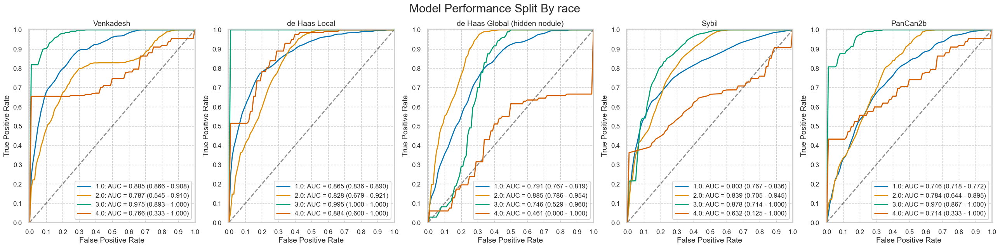

,num,pct,num_mal,pct_mal
1.0,2029,94.284387,243,11.976343
2.0,73,3.392193,13,17.808219
3.0,20,0.929368,4,20.000000
4.0,10,0.464684,3,30.000000
5.0,7,0.325279,0,0.000000
6.0,13,0.604089,1,7.692308


More than binary: not computing significance test results.


#### ethnic: Emphysema = False

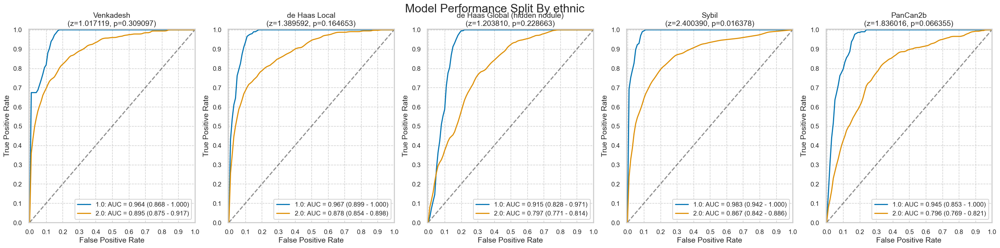

,num,pct,num_mal,pct_mal
1.0,70,1.876676,4,5.714286
2.0,3660,98.123324,311,8.497268


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,1.017119,1.389592,1.203810,2.400390,1.836016
p,0.309097,0.164653,0.228663,0.016378,0.066355


#### ethnic: Emphysema = True

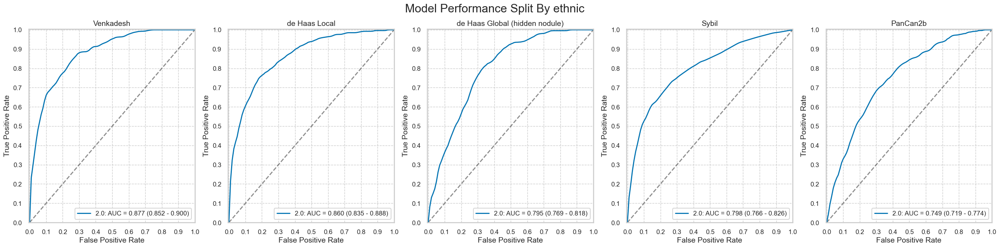

,num,pct,num_mal,pct_mal
1.0,28,1.304145,0,0.000000
2.0,2119,98.695855,263,12.411515


More than binary: not computing significance test results.


#### Gender: Emphysema = False

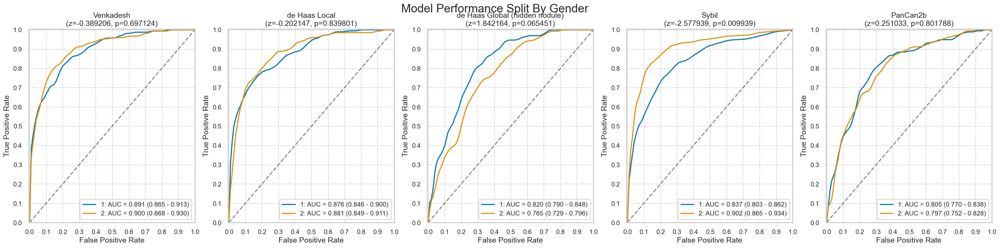

,num,pct,num_mal,pct_mal
1,2127,56.644474,175,8.227551
2,1628,43.355526,142,8.722359


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.389206,-0.202147,1.842164,-2.577939,0.251033
p,0.697124,0.839801,0.065451,0.009939,0.801788


#### Gender: Emphysema = True

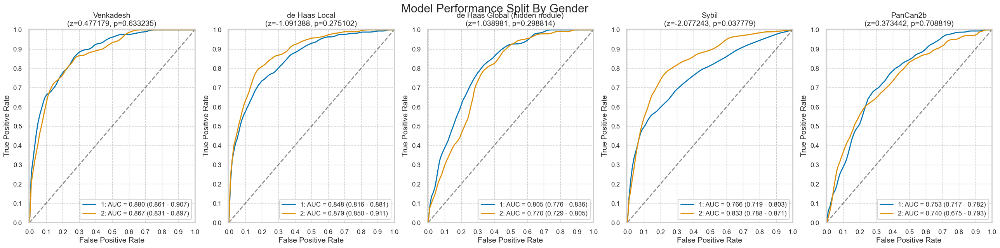

,num,pct,num_mal,pct_mal
1,1314,60.946197,162,12.328767
2,842,39.053803,102,12.114014


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.477179,-1.091388,1.038981,-2.077243,0.373442
p,0.633235,0.275102,0.298814,0.037779,0.708819


#### Married: Emphysema = False

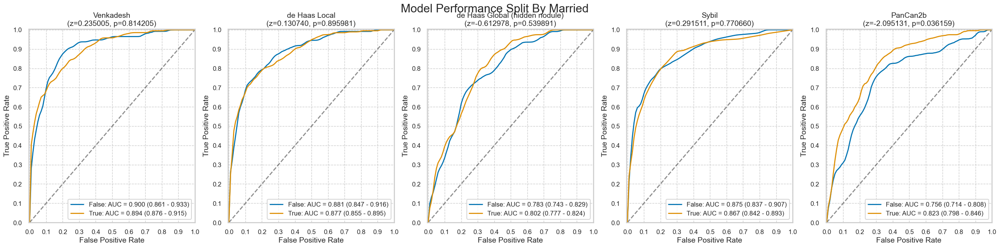

,num,pct,num_mal,pct_mal
False,1218,32.436751,109,8.949097
True,2537,67.563249,208,8.198660


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.235005,0.130740,-0.612978,0.291511,-2.095131
p,0.814205,0.895981,0.539891,0.770660,0.036159


#### Married: Emphysema = True

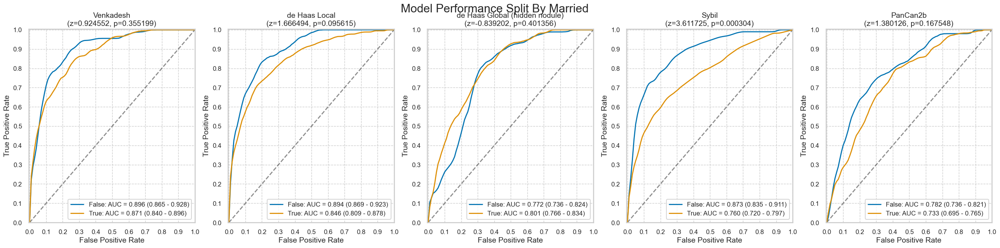

,num,pct,num_mal,pct_mal
False,719,33.348794,88,12.239221
True,1437,66.651206,176,12.247738


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.924552,1.666494,-0.839202,3.611725,1.380126
p,0.355199,0.095615,0.401356,0.000304,0.167548


#### NonHispanicWhite: Emphysema = False

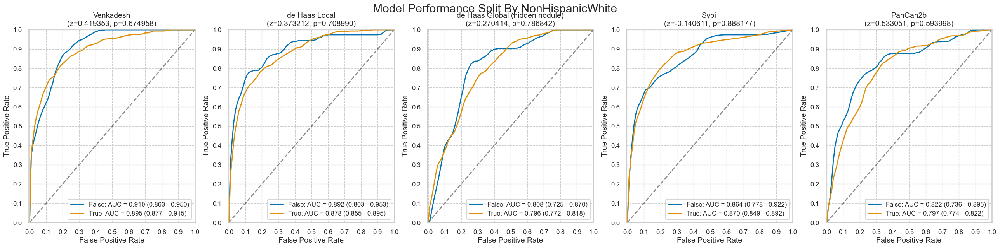

,num,pct,num_mal,pct_mal
False,323,8.601864,33,10.216718
True,3432,91.398136,284,8.275058


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.419353,0.373212,0.270414,-0.140611,0.533051
p,0.674958,0.708990,0.786842,0.888177,0.593998


#### NonHispanicWhite: Emphysema = True

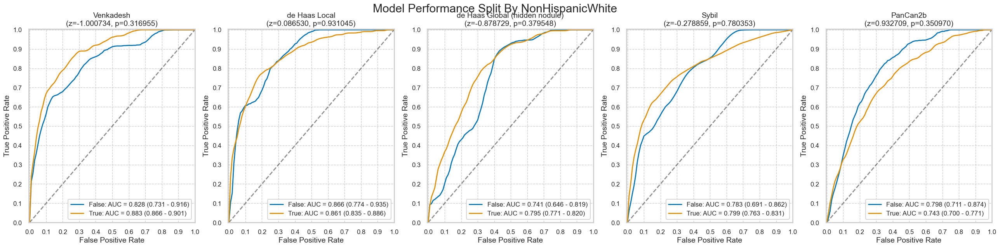

,num,pct,num_mal,pct_mal
False,158,7.328386,22,13.924051
True,1998,92.671614,242,12.112112


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-1.000734,0.086530,-0.878729,-0.278859,0.932709
p,0.316955,0.931045,0.379548,0.780353,0.350970


#### HighSchoolPlus: Emphysema = False

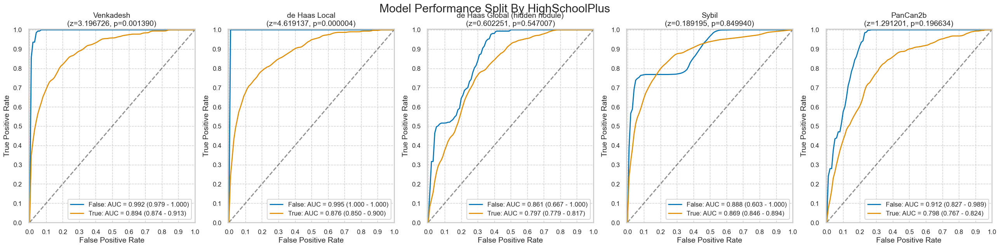

,num,pct,num_mal,pct_mal
False,66,1.757656,5,7.575758
True,3689,98.242344,312,8.457577


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,3.196726,4.619137,0.602251,0.189195,1.291201
p,0.001390,0.000004,0.547007,0.849940,0.196634


#### HighSchoolPlus: Emphysema = True

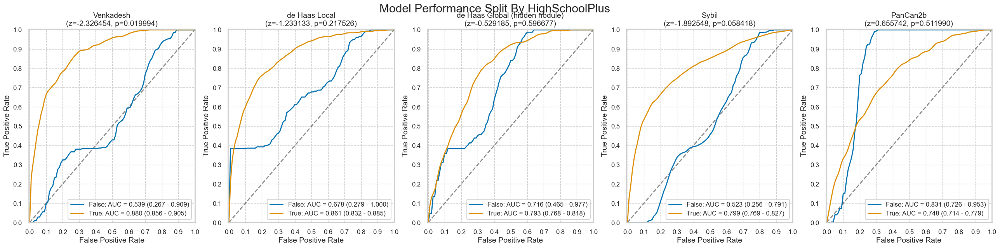

,num,pct,num_mal,pct_mal
False,45,2.087199,4,8.888889
True,2111,97.912801,260,12.316438


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-2.326454,-1.233133,-0.529185,-1.892548,0.655742
p,0.019994,0.217526,0.596677,0.058418,0.511990


In [71]:
for cat in nlst_democols['cat']['demo']:
    plot_intersectional(nlst_preds, cat)

### Smoking

#### cigar: Emphysema = False

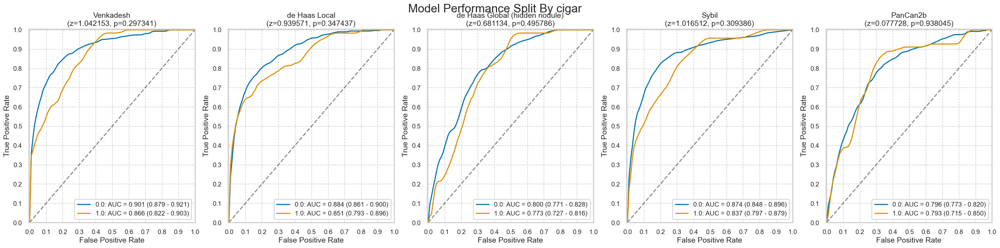

,num,pct,num_mal,pct_mal
0.0,3006,80.460385,261,8.682635
1.0,730,19.539615,55,7.534247


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,1.042153,0.939571,0.681134,1.016512,0.077728
p,0.297341,0.347437,0.495786,0.309386,0.938045


#### cigar: Emphysema = True

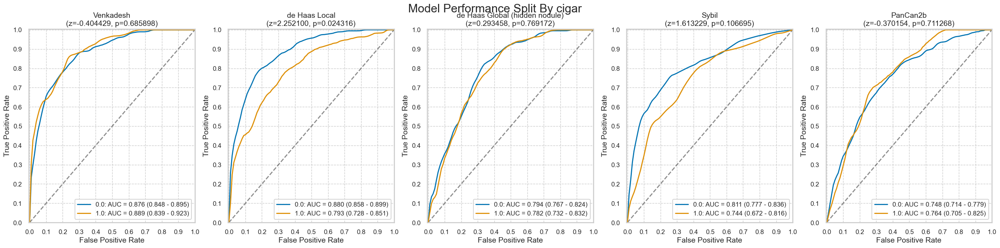

,num,pct,num_mal,pct_mal
0.0,1732,80.55814,209,12.066975
1.0,418,19.44186,54,12.918660


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.404429,2.252100,0.293458,1.613229,-0.370154
p,0.685898,0.024316,0.769172,0.106695,0.711268


#### cigsmok: Emphysema = False

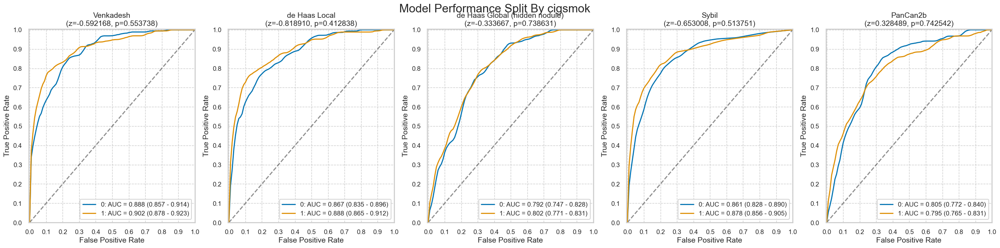

,num,pct,num_mal,pct_mal
0,2016,53.688415,157,7.787698
1,1739,46.311585,160,9.200690


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.592168,-0.818910,-0.333667,-0.653008,0.328489
p,0.553738,0.412838,0.738631,0.513751,0.742542


#### cigsmok: Emphysema = True

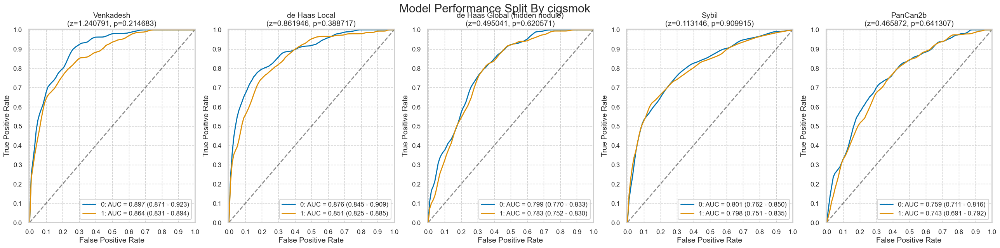

,num,pct,num_mal,pct_mal
0,914,42.393321,110,12.035011
1,1242,57.606679,154,12.399356


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,1.240791,0.861946,0.495041,0.113146,0.465872
p,0.214683,0.388717,0.620571,0.909915,0.641307


#### pipe: Emphysema = False

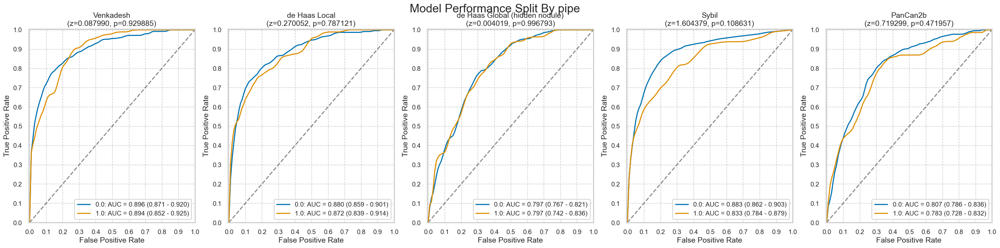

,num,pct,num_mal,pct_mal
0.0,2928,78.561846,235,8.025956
1.0,799,21.438154,81,10.137672


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.087990,0.270052,0.004019,1.604379,0.719299
p,0.929885,0.787121,0.996793,0.108631,0.471957


#### pipe: Emphysema = True

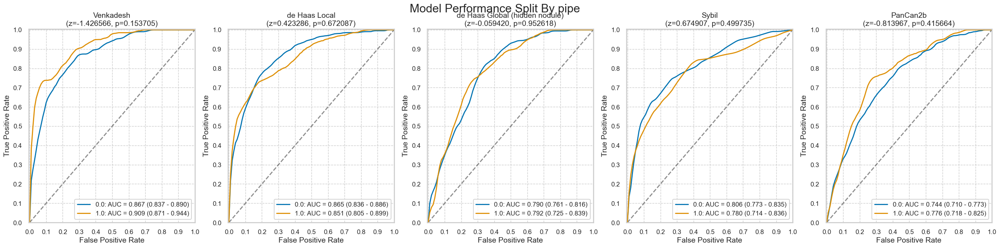

,num,pct,num_mal,pct_mal
0.0,1647,76.640298,201,12.204007
1.0,502,23.359702,62,12.350598


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-1.426566,0.423286,-0.059420,0.674907,-0.813967
p,0.153705,0.672087,0.952618,0.499735,0.415664


#### smokelive: Emphysema = False

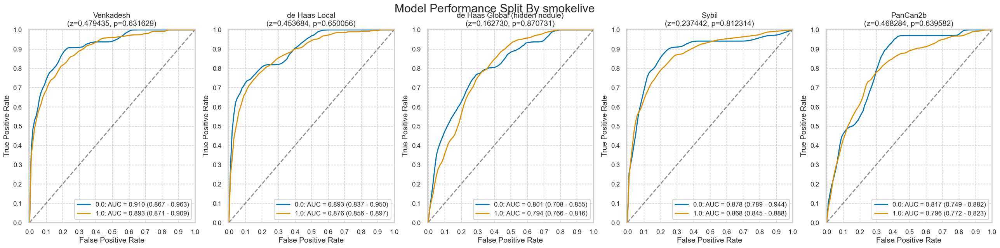

,num,pct,num_mal,pct_mal
0.0,422,11.325819,34,8.056872
1.0,3304,88.674181,281,8.504843


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.479435,0.453684,0.162730,0.237442,0.468284
p,0.631629,0.650056,0.870731,0.812314,0.639582


#### smokelive: Emphysema = True

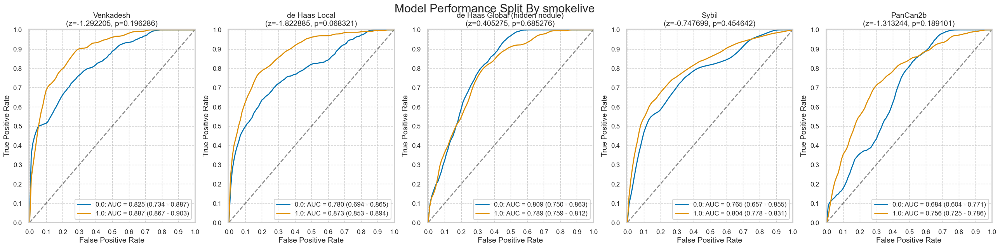

,num,pct,num_mal,pct_mal
0.0,243,11.302326,30,12.345679
1.0,1907,88.697674,233,12.218144


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-1.292205,-1.822885,0.405275,-0.747699,-1.313244
p,0.196286,0.068321,0.685276,0.454642,0.189101


#### smokework: Emphysema = False

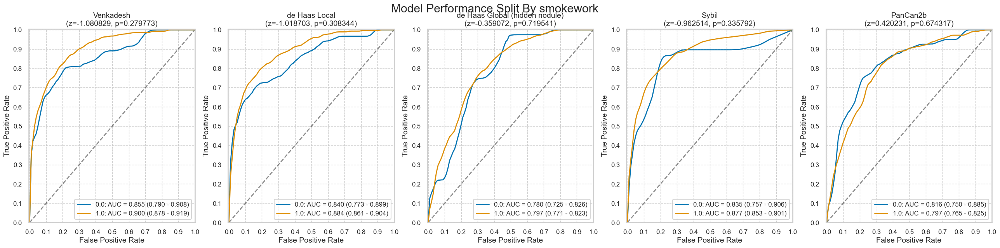

,num,pct,num_mal,pct_mal
0.0,497,13.367402,36,7.243461
1.0,3221,86.632598,278,8.630860


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-1.080829,-1.018703,-0.359072,-0.962514,0.420231
p,0.279773,0.308344,0.719541,0.335792,0.674317


#### smokework: Emphysema = True

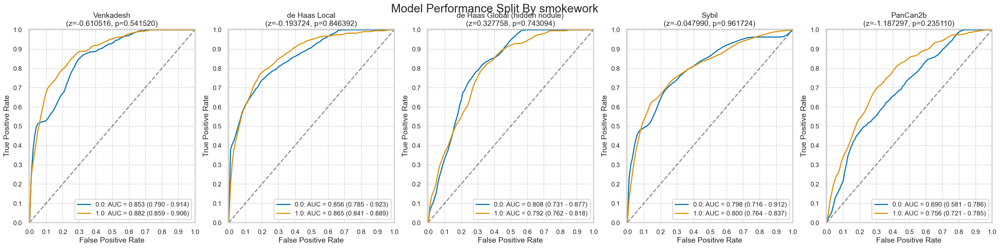

,num,pct,num_mal,pct_mal
0.0,225,10.48951,29,12.888889
1.0,1920,89.51049,234,12.187500


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.610516,-0.193724,0.327758,-0.047990,-1.187297
p,0.541520,0.846392,0.743094,0.961724,0.235110


In [72]:
for cat in nlst_democols['cat']['smoke']:
    plot_intersectional(nlst_preds, cat)

## Binning for numerical demographic columns

### Demographics

C:\Users\shaur\AppData\Local\Temp\ipykernel_21132\3338818666.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby('bin_Age')['label'].describe())


,count,mean,std,min,25%,50%,75%,max
bin_Age,,,,,,,,
"(53.999, 62.0]",2988.0,0.088353,0.283856,0.0,0.0,0.0,0.0,1.0
"(62.0, 76.0]",2923.0,0.108450,0.311001,0.0,0.0,0.0,0.0,1.0


#### bin_Age: Emphysema = False

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


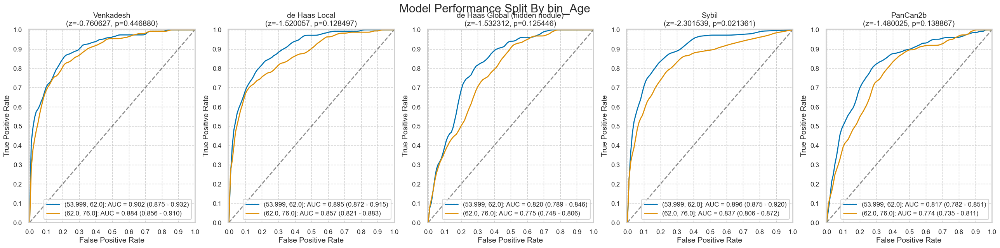

,num,pct,num_mal,pct_mal
"(53.999, 62.0]",1979,52.703063,151,7.630116
"(62.0, 76.0]",1776,47.296937,166,9.346847


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.760627,-1.520057,-1.532312,-2.301539,-1.480025
p,0.446880,0.128497,0.125446,0.021361,0.138867


#### bin_Age: Emphysema = True

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


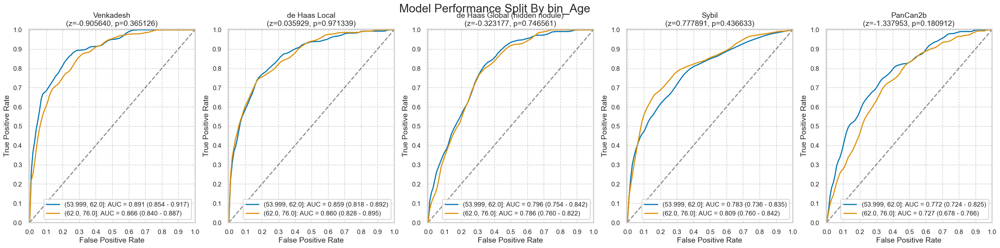

,num,pct,num_mal,pct_mal
"(53.999, 62.0]",1009,46.799629,113,11.199207
"(62.0, 76.0]",1147,53.200371,151,13.164778


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.905640,0.035929,-0.323177,0.777891,-1.337953
p,0.365126,0.971339,0.746561,0.436633,0.180912


In [73]:
# nlst_preds['bin_Age'] = pd.cut(nlst_preds['Age'], bins=[55, 60, 65, 70, 78], right=False)
nlst_preds['bin_Age'] = pd.qcut(nlst_preds['Age'], q=2)
display(nlst_preds.groupby('bin_Age')['label'].describe())
plot_intersectional(nlst_preds, f'bin_Age')

C:\Users\shaur\AppData\Local\Temp\ipykernel_21132\1366853022.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby('bin_height')[['label', 'height']].describe())


label                                               height  \
             count      mean       std  min  25%  50%  75%  max   count   
bin_height                                                                
(48, 68]    3134.0  0.099553  0.299451  0.0  0.0  0.0  0.0  1.0  3134.0   
(68, 88]    2767.0  0.096494  0.295321  0.0  0.0  0.0  0.0  1.0  2767.0   

                                                               
                 mean       std   min   25%   50%   75%   max  
bin_height                                                     
(48, 68]    64.869177  2.355045  53.0  63.0  65.0  67.0  68.0  
(68, 88]    71.503072  1.994545  69.0  70.0  71.0  73.0  83.0

#### bin_height: Emphysema = False

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


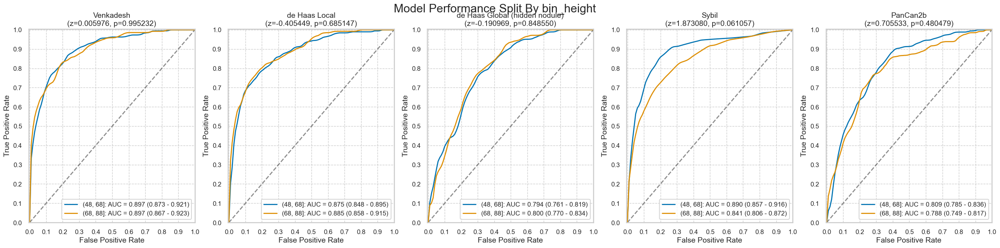

,num,pct,num_mal,pct_mal
"(48, 68]",2056,54.81205,181,8.803502
"(68, 88]",1695,45.18795,135,7.964602


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.005976,-0.405449,-0.190969,1.873080,0.705533
p,0.995232,0.685147,0.848550,0.061057,0.480479


#### bin_height: Emphysema = True

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


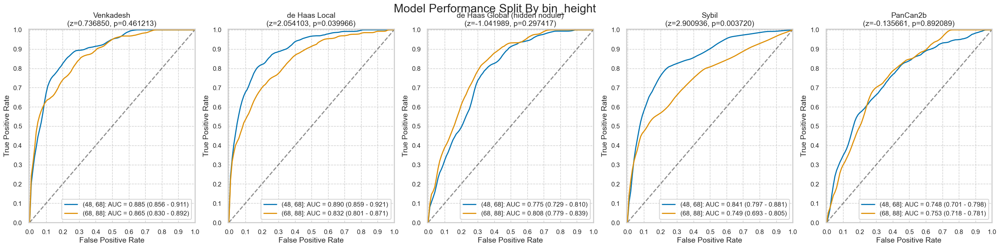

,num,pct,num_mal,pct_mal
"(48, 68]",1078,50.139535,131,12.152134
"(68, 88]",1072,49.860465,132,12.313433


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.736850,2.054103,-1.041989,2.900936,-0.135661
p,0.461213,0.039966,0.297417,0.003720,0.892089


In [74]:
nlst_preds['bin_height'] = pd.cut(nlst_preds['height'], bins=[48, 68, 88], right=True)
display(nlst_preds.groupby('bin_height')[['label', 'height']].describe())
plot_intersectional(nlst_preds, f'bin_height')

C:\Users\shaur\AppData\Local\Temp\ipykernel_21132\936658290.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby('bin_weight')[['label', 'weight']].describe())


label                                               weight  \
             count      mean       std  min  25%  50%  75%  max   count   
bin_weight                                                                
(79, 179]   2855.0  0.105779  0.307609  0.0  0.0  0.0  0.0  1.0  2855.0   
(179, 279]  2961.0  0.091523  0.288400  0.0  0.0  0.0  0.0  1.0  2961.0   

                                                                     
                 mean        std    min    25%    50%    75%    max  
bin_weight                                                           
(79, 179]   150.09387  19.487052   88.0  137.0  154.0  165.0  179.0  
(179, 279]  209.49409  23.817196  180.0  190.0  204.0  225.0  279.0

#### bin_weight: Emphysema = False

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


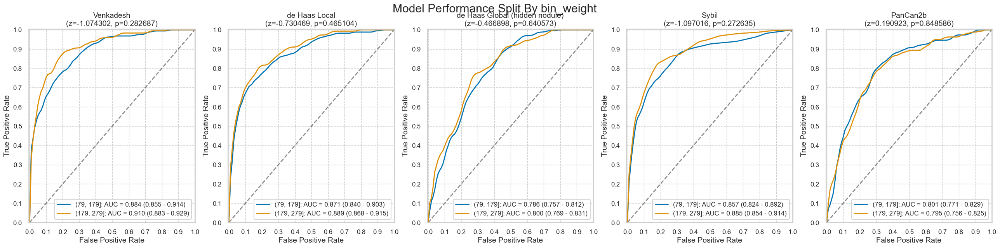

,num,pct,num_mal,pct_mal
"(79, 179]",1655,44.863107,157,9.486405
"(179, 279]",2034,55.136893,156,7.669617


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-1.074302,-0.730469,-0.466898,-1.097016,0.190923
p,0.282687,0.465104,0.640573,0.272635,0.848586


#### bin_weight: Emphysema = True

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


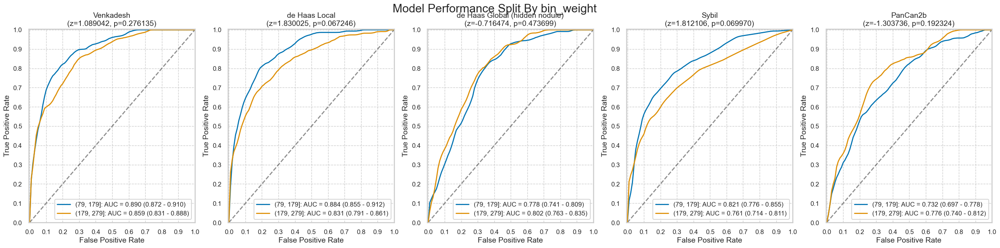

,num,pct,num_mal,pct_mal
"(79, 179]",1200,56.417489,145,12.083333
"(179, 279]",927,43.582511,115,12.405609


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,1.089042,1.830025,-0.716474,1.812106,-1.303736
p,0.276135,0.067246,0.473699,0.069970,0.192324


In [75]:
nlst_preds['bin_weight'] = pd.cut(nlst_preds['weight'], bins=[79, 179, 279], right=True)
display(nlst_preds.groupby('bin_weight')[['label', 'weight']].describe())
plot_intersectional(nlst_preds, f'bin_weight')

### Smoking

C:\Users\shaur\AppData\Local\Temp\ipykernel_21132\528562451.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                                 pkyr  \
                 count      mean       std  min  25%  50%  75%  max   count   
bin_pkyr                                                                      
(29.999, 51.0]  3027.0  0.079617  0.270744  0.0  0.0  0.0  0.0  1.0  3027.0   
(51.0, 260.0]   2884.0  0.117892  0.322536  0.0  0.0  0.0  0.0  1.0  2884.0   

                                                                      
                     mean        std    min   25%   50%   75%    max  
bin_pkyr                                                              
(29.999, 51.0]  40.627800   5.760036  30.00  36.0  41.0  45.0   51.0  
(51.0, 260.0]   76.879785  24.261537  51.25  60.0  70.0  87.5  260.0

#### bin_pkyr: Emphysema = False

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


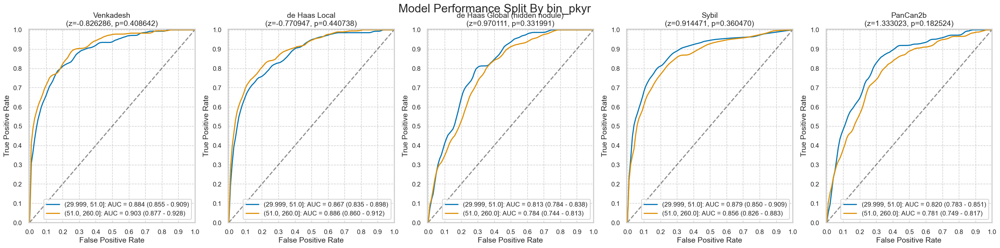

,num,pct,num_mal,pct_mal
"(29.999, 51.0]",2085,55.525965,143,6.858513
"(51.0, 260.0]",1670,44.474035,174,10.419162


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.826286,-0.770947,0.970111,0.914471,1.333023
p,0.408642,0.440738,0.331991,0.360470,0.182524


#### bin_pkyr: Emphysema = True

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


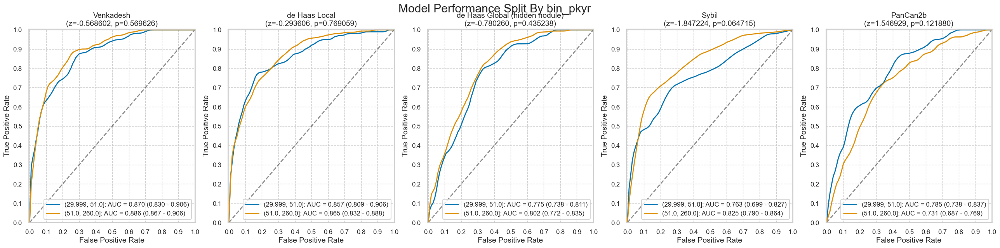

,num,pct,num_mal,pct_mal
"(29.999, 51.0]",942,43.692022,98,10.403397
"(51.0, 260.0]",1214,56.307978,166,13.673806


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.568602,-0.293606,-0.780260,-1.847224,1.546929
p,0.569626,0.769059,0.435238,0.064715,0.121880


C:\Users\shaur\AppData\Local\Temp\ipykernel_21132\528562451.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              smokeage  \
                count      mean       std  min  25%  50%  75%  max    count   
bin_smokeage                                                                  
(4.999, 16.0]  3256.0  0.106572  0.308616  0.0  0.0  0.0  0.0  1.0   3256.0   
(16.0, 40.0]   2655.0  0.088136  0.283545  0.0  0.0  0.0  0.0  1.0   2655.0   

                                                                  
                    mean       std   min   25%   50%   75%   max  
bin_smokeage                                                      
(4.999, 16.0]  14.136978  2.000377   5.0  13.0  15.0  16.0  16.0  
(16.0, 40.0]   19.381544  2.716198  17.0  18.0  18.0  20.0  40.0

#### bin_smokeage: Emphysema = False

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


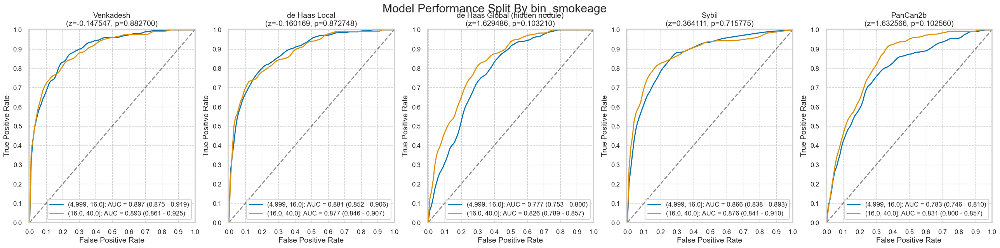

,num,pct,num_mal,pct_mal
"(4.999, 16.0]",2040,54.327563,195,9.558824
"(16.0, 40.0]",1715,45.672437,122,7.113703


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.147547,-0.160169,1.629486,0.364111,1.632566
p,0.882700,0.872748,0.103210,0.715775,0.102560


#### bin_smokeage: Emphysema = True

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


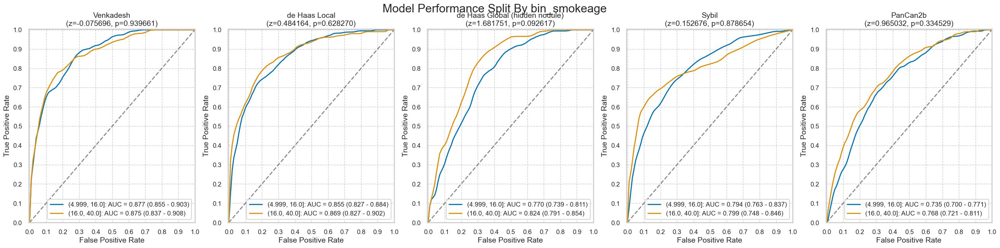

,num,pct,num_mal,pct_mal
"(4.999, 16.0]",1216,56.400742,152,12.500000
"(16.0, 40.0]",940,43.599258,112,11.914894


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.075696,0.484164,1.681751,0.152676,0.965032
p,0.939661,0.628270,0.092617,0.878654,0.334529


C:\Users\shaur\AppData\Local\Temp\ipykernel_21132\528562451.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              smokeday  \
                 count      mean       std  min  25%  50%  75%  max    count   
bin_smokeday                                                                   
(11.999, 25.0]  3119.0  0.089772  0.285901  0.0  0.0  0.0  0.0  1.0   3119.0   
(25.0, 135.0]   2792.0  0.107808  0.310193  0.0  0.0  0.0  0.0  1.0   2792.0   

                                                                     
                     mean        std   min   25%   50%   75%    max  
bin_smokeday                                                         
(11.999, 25.0]  20.117025   2.153974  12.0  20.0  20.0  20.0   25.0  
(25.0, 135.0]   38.157593  10.650142  26.0  30.0  40.0  40.0  135.0

#### bin_smokeday: Emphysema = False

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


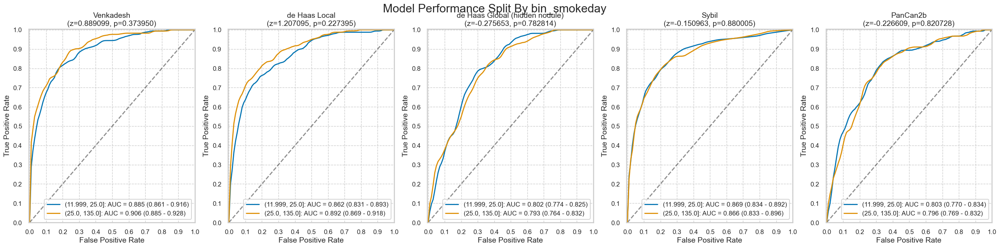

,num,pct,num_mal,pct_mal
"(11.999, 25.0]",2052,54.647137,153,7.456140
"(25.0, 135.0]",1703,45.352863,164,9.630065


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.889099,1.207095,-0.275653,-0.150963,-0.226609
p,0.373950,0.227395,0.782814,0.880005,0.820728


#### bin_smokeday: Emphysema = True

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


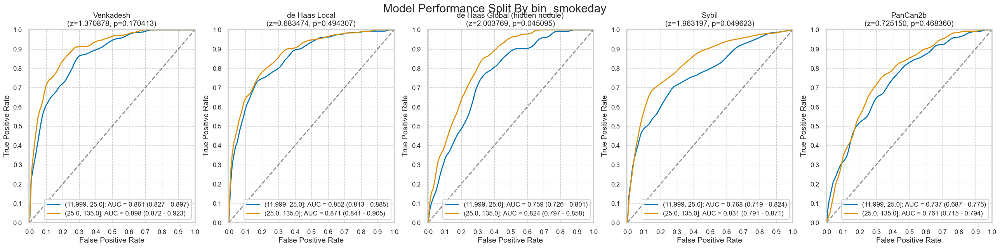

,num,pct,num_mal,pct_mal
"(11.999, 25.0]",1067,49.489796,127,11.902530
"(25.0, 135.0]",1089,50.510204,137,12.580349


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,1.370878,0.683474,2.003769,1.963197,0.72515
p,0.170413,0.494307,0.045095,0.049623,0.46836


C:\Users\shaur\AppData\Local\Temp\ipykernel_21132\528562451.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())


label                                              smokeyr  \
                 count      mean       std  min  25%  50%  75%  max   count   
bin_smokeyr                                                                   
(15.999, 41.0]  3073.0  0.070290  0.255676  0.0  0.0  0.0  0.0  1.0  3073.0   
(41.0, 67.0]    2838.0  0.128612  0.334829  0.0  0.0  0.0  0.0  1.0  2838.0   

                                                                   
                     mean       std   min   25%   50%   75%   max  
bin_smokeyr                                                        
(15.999, 41.0]  35.559714  4.645131  16.0  33.0  36.0  39.0  41.0  
(41.0, 67.0]    47.241720  4.421492  42.0  44.0  46.0  50.0  67.0

#### bin_smokeyr: Emphysema = False

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


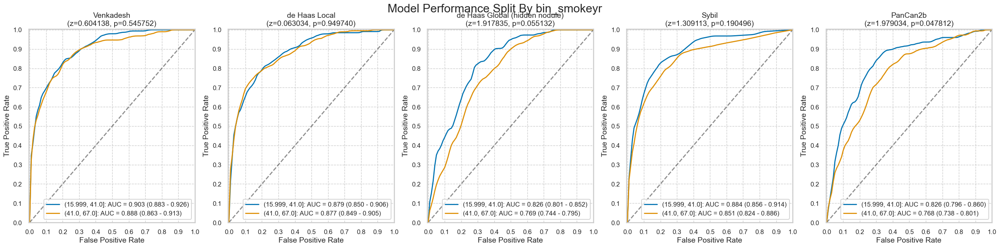

,num,pct,num_mal,pct_mal
"(15.999, 41.0]",2121,56.484687,133,6.270627
"(41.0, 67.0]",1634,43.515313,184,11.260710


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,0.604138,0.063034,1.917835,1.309113,1.979034
p,0.545752,0.949740,0.055132,0.190496,0.047812


#### bin_smokeyr: Emphysema = True

c:\Users\shaur\Documents\bodyct-lung-malignancy-fairness\utils.py:234: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  groups = df.groupby(cat)


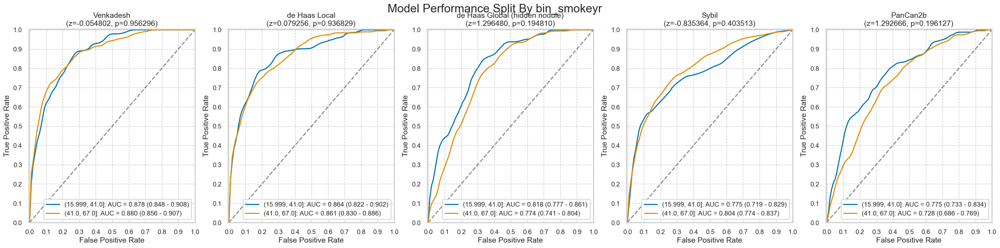

,num,pct,num_mal,pct_mal
"(15.999, 41.0]",952,44.155844,83,8.718487
"(41.0, 67.0]",1204,55.844156,181,15.033223


Hanley-McNeil significance test results:


,Venkadesh,de Haas Local,de Haas Global (hidden nodule),Sybil,PanCan2b
z,-0.054802,0.079256,1.29648,-0.835364,1.292666
p,0.956296,0.936829,0.19481,0.403513,0.196127


In [76]:
for c in nlst_democols['num']['smoke']:
    nlst_preds[f'bin_{c}'] = pd.qcut(nlst_preds[c], q=2)
    display(nlst_preds.groupby(f'bin_{c}')[['label', f'{c}']].describe())
    plot_intersectional(nlst_preds, f'bin_{c}')